# Traffic Light Detection Demo

# Imports

In [1]:
import numpy as np
import os
import sys
import glob
import random
import math
import time

import tensorflow as tf
import cv2

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

## Env setup

In [2]:
# This is needed to display the images.
%matplotlib inline

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")

## Object detection imports
Here are the imports from the object detection module.

In [3]:
from utils import label_map_util

from utils import visualization_utils as vis_util

# Model preparation 

## Variables

Any model exported using the `export_inference_graph.py` tool can be loaded here simply by changing `PATH_TO_CKPT` to point to a new .pb file.  

By default we use an "SSD with Mobilenet" model here. See the [detection model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md) for a list of other models that can be run out-of-the-box with varying speeds and accuracies.

In [4]:
# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = 'model/faster_rcnn_resnet101_coco/10_min/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = '../data/mscoco_label_map.pbtxt'

NUM_CLASSES = 90

## Load a (frozen) Tensorflow model into memory.

In [5]:
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [6]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

## Helper code

In [7]:
def load_image_into_numpy_array(image):
    im_width, im_height = image.size
    return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

TRAFFIC_LIGHT_SHAPE = (8, 24)

w, h = TRAFFIC_LIGHT_SHAPE

h1 = h//3
h2 = (2 * h) // 3

HSV_V_THRESHOLD = 210

def get_traffic_light_state(image):
    resized = cv2.resize(image, TRAFFIC_LIGHT_SHAPE)
    hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)

    lower_red = np.array([150, 0, HSV_V_THRESHOLD])
    upper_red = np.array([180, 255, 255])
    red_mask1 = cv2.inRange(hsv[:h1, :], lower_red, upper_red)

    lower_red = np.array([0, 0, HSV_V_THRESHOLD])
    upper_red = np.array([30, 255, 255])
    red_mask2 = cv2.inRange(hsv[:h1, :], lower_red, upper_red)

    red_mask = red_mask1 + red_mask2

    lower_yellow = np.array([0, 0, HSV_V_THRESHOLD])
    upper_yellow = np.array([60, 255, 255])
    yellow_mask = cv2.inRange(hsv[h1:h2, :], lower_yellow, upper_yellow)

    lower_green = np.array([30, 0, HSV_V_THRESHOLD])
    upper_green = np.array([100, 255, 255])
    green_mask = cv2.inRange(hsv[h2:, :], lower_green, upper_green)

    color_mask = np.vstack((red_mask, yellow_mask, green_mask))

    lower_white = np.array([0, 0, 245])
    upper_white = np.array([180, 10, 255])
    white_mask = cv2.inRange(hsv, lower_white, upper_white)

    tl_mask = cv2.bitwise_or(white_mask, color_mask)

    v_ch = hsv[:, :, 2]

    v_ch[tl_mask == 0] = 0

    intensity = np.hstack((np.sum(np.sum(v_ch[1:h1 - 1, 1:-1], axis=1, dtype=np.float32)),
                           np.sum(np.sum(v_ch[h1 + 1:h2 - 1, 1:-1], axis=1, dtype=np.float32)),
                           np.sum(np.sum(v_ch[h2 + 1:-1, 1:-1], axis=1, dtype=np.float32))))

    if intensity[0] == intensity[1] and intensity[1] == intensity[2]:
        return 4

    return np.argmax(intensity)

# Detection and Classification

In [8]:
TEST_IMAGE_PATHS = glob.glob('data/test_images_all/**/*.jpg')
random.shuffle(TEST_IMAGE_PATHS)

# Test the first 20 images after shuffling
TEST_IMAGE_PATHS = TEST_IMAGE_PATHS[:30]

Added traffic light box=(34,93) score=0.9962 state=
Detected 1 traffic lights out of 10 objects in 10.158s


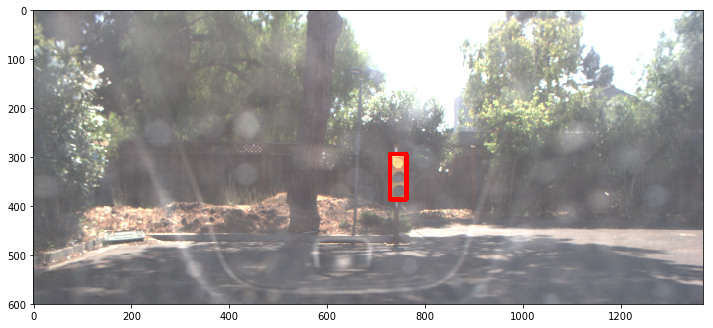

Detected 0 traffic lights out of 10 objects in 0.314s


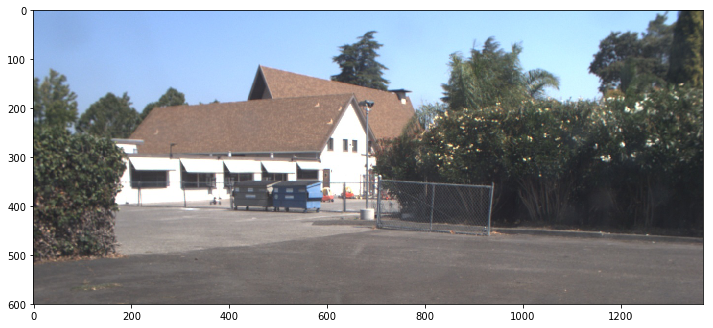

Added traffic light box=(79,224) score=0.9987 state=
Detected 1 traffic lights out of 10 objects in 0.300s


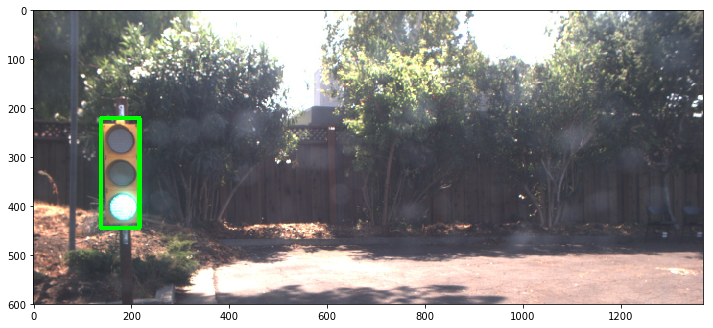

Added traffic light box=(29,79) score=0.9938 state=
Detected 1 traffic lights out of 10 objects in 0.311s


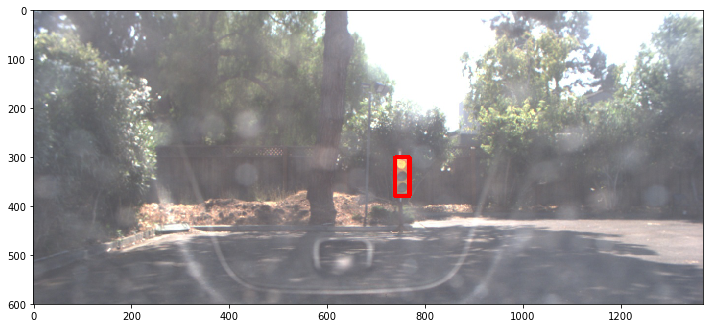

Added traffic light box=(83,233) score=0.9988 state=
Detected 1 traffic lights out of 10 objects in 0.313s


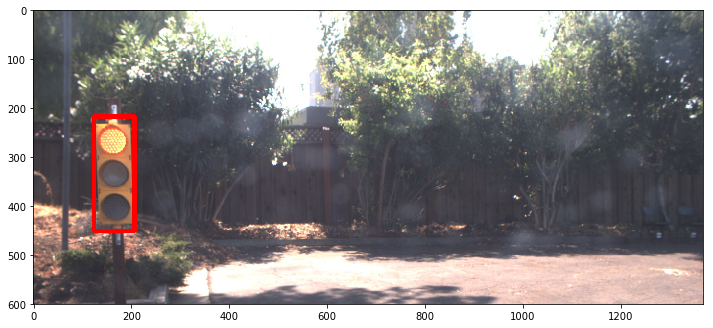

Detected 0 traffic lights out of 10 objects in 0.305s


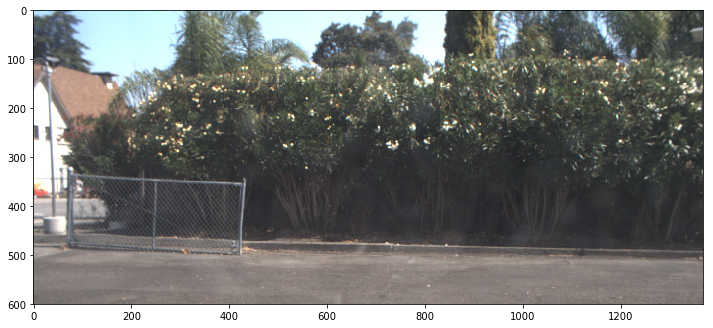

Detected 0 traffic lights out of 10 objects in 0.298s


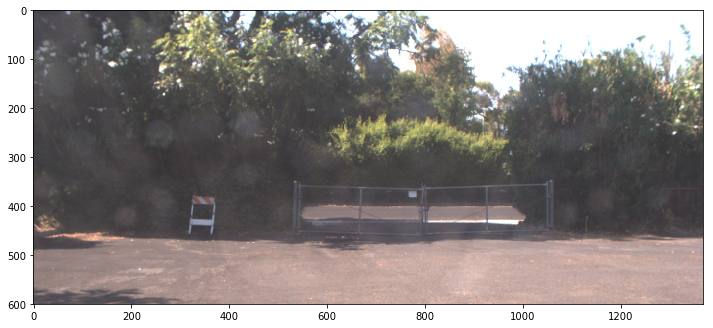

Detected 0 traffic lights out of 10 objects in 0.299s


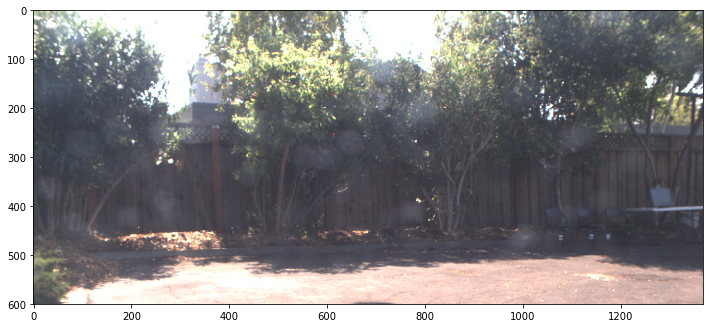

Added traffic light box=(37,104) score=0.9947 state=
Detected 1 traffic lights out of 10 objects in 0.298s


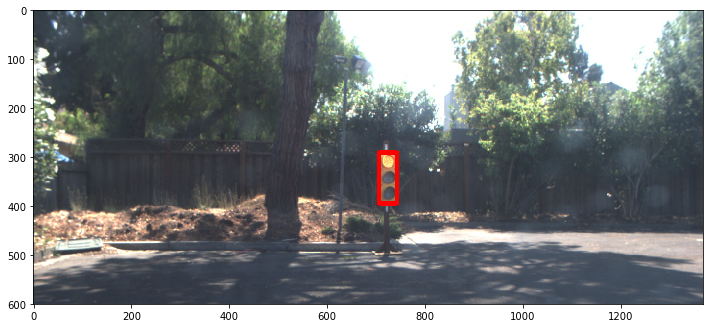

Added traffic light box=(70,196) score=0.9960 state=
Detected 1 traffic lights out of 10 objects in 0.299s


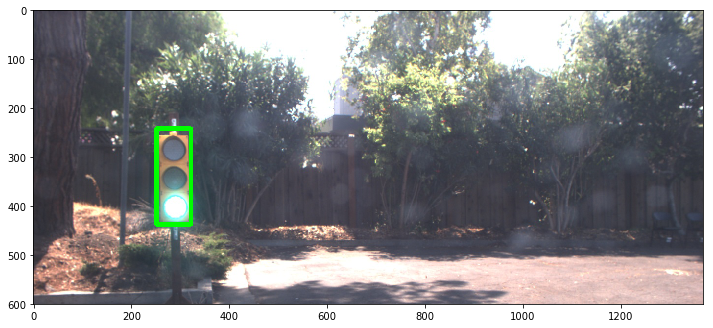

Discarded traffic light box=(21,23) score=0.1717
Detected 0 traffic lights out of 10 objects in 0.299s


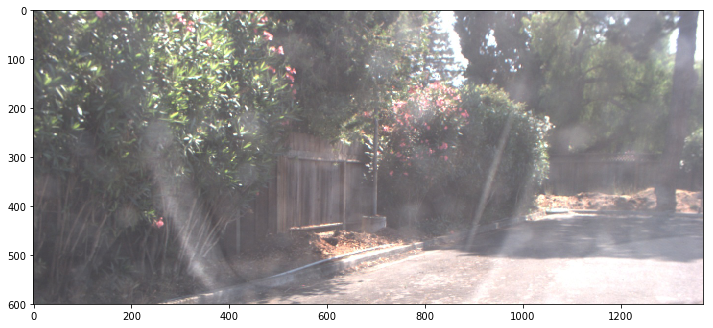

Added traffic light box=(34,89) score=0.9885 state=
Discarded traffic light box=(51,53) score=0.0008
Detected 1 traffic lights out of 10 objects in 0.298s


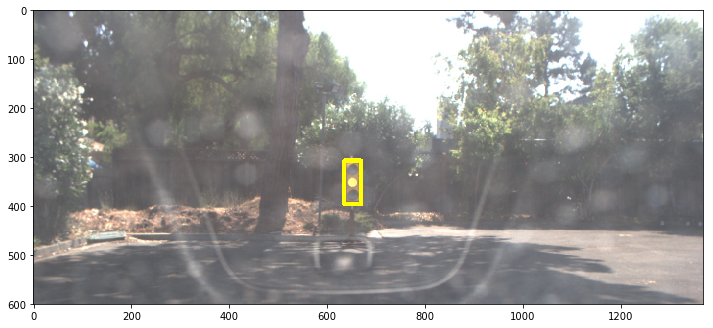

Detected 0 traffic lights out of 10 objects in 0.296s


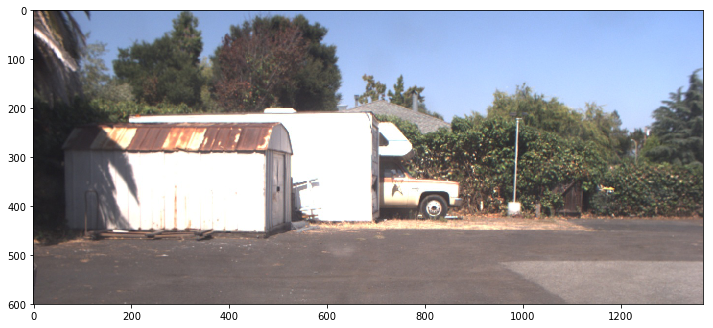

Added traffic light box=(40,100) score=0.9963 state=
Detected 1 traffic lights out of 10 objects in 0.300s


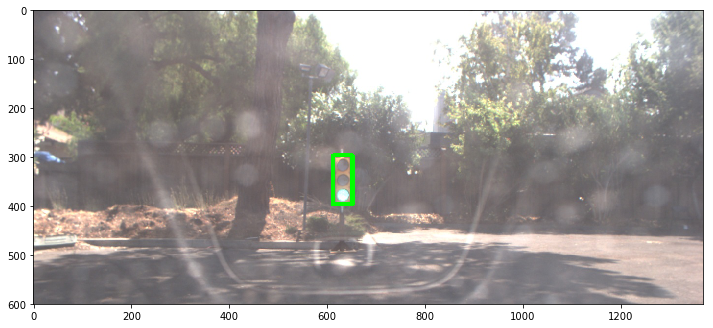

Detected 0 traffic lights out of 10 objects in 0.300s


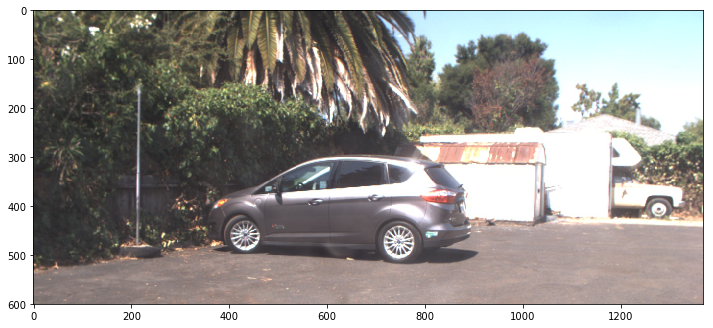

Added traffic light box=(43,280) score=0.9916 state=
Detected 1 traffic lights out of 10 objects in 0.301s


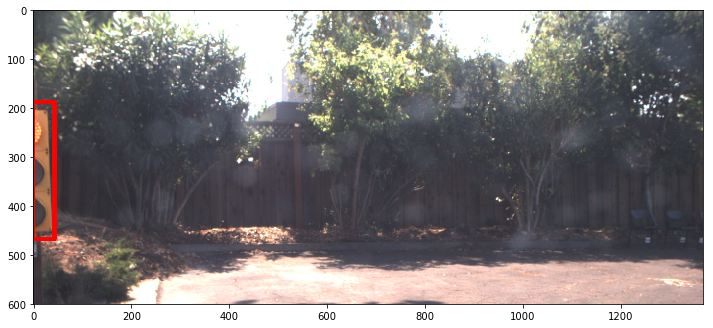

Discarded traffic light box=(68,31) score=0.0025
Detected 0 traffic lights out of 10 objects in 0.302s


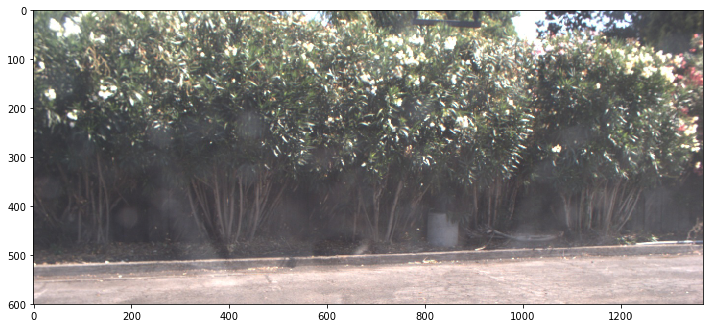

Detected 0 traffic lights out of 10 objects in 0.298s


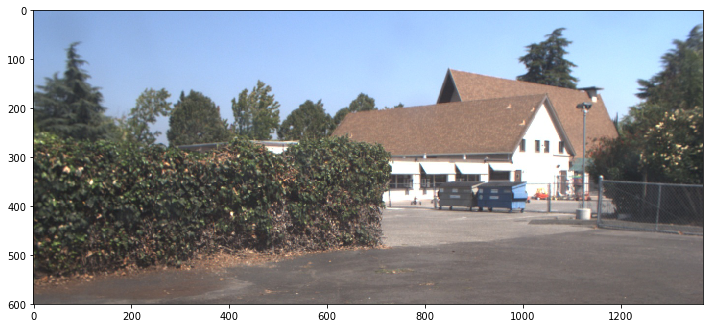

Detected 0 traffic lights out of 10 objects in 0.301s


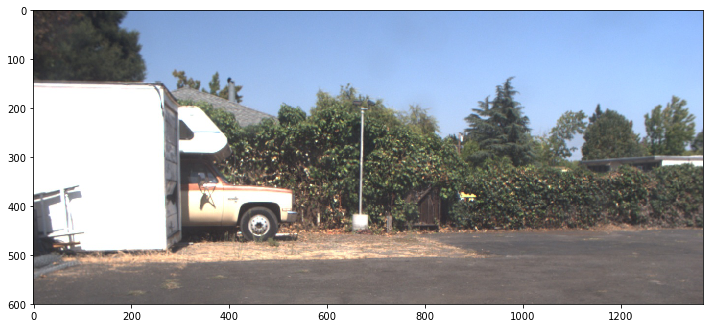

Added traffic light box=(69,192) score=0.9963 state=
Detected 1 traffic lights out of 10 objects in 0.299s


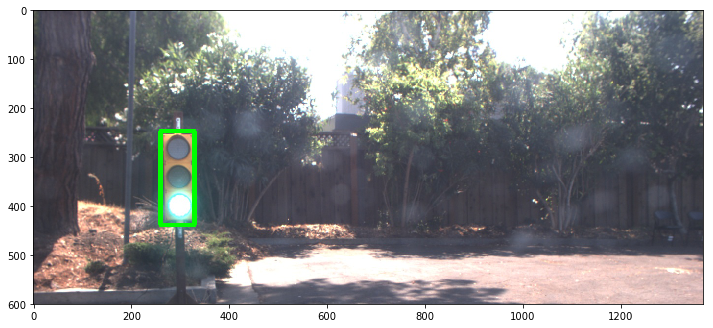

Added traffic light box=(60,165) score=0.9986 state=
Discarded traffic light box=(24,25) score=0.0333
Detected 1 traffic lights out of 10 objects in 0.299s


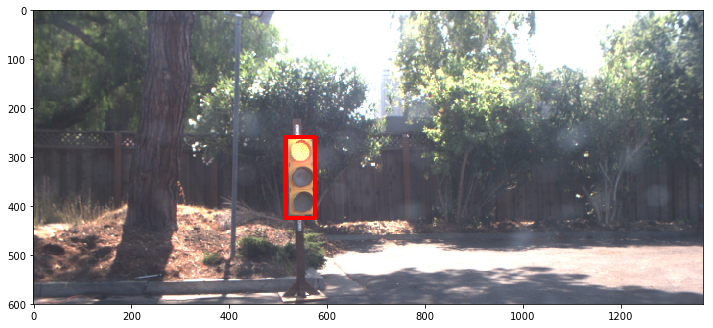

Detected 0 traffic lights out of 10 objects in 0.298s


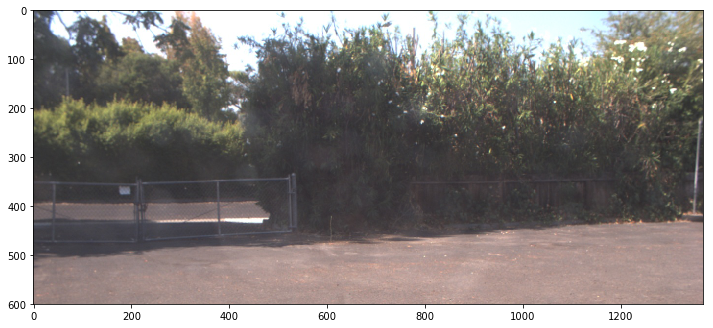

Added traffic light box=(69,192) score=0.9979 state=
Detected 1 traffic lights out of 10 objects in 0.300s


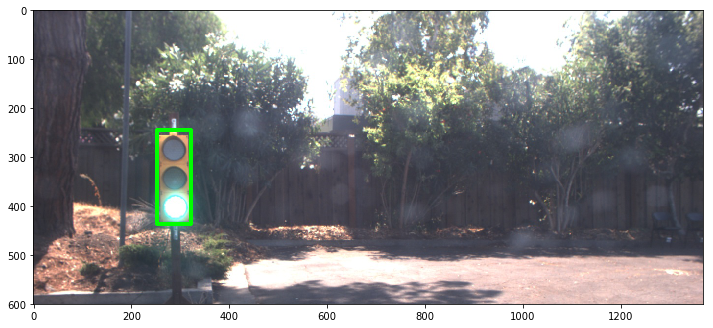

Detected 0 traffic lights out of 10 objects in 0.308s


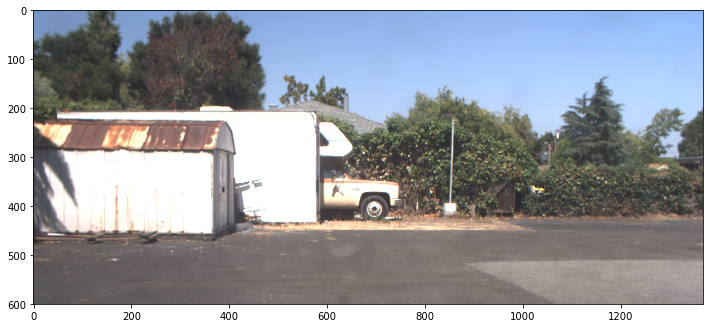

Added traffic light box=(32,85) score=0.9926 state=
Discarded traffic light box=(8,10) score=0.0133
Detected 1 traffic lights out of 10 objects in 0.301s


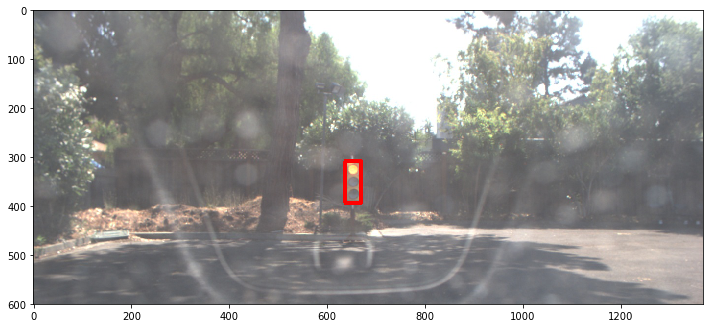

Added traffic light box=(29,87) score=0.9842 state=
Detected 1 traffic lights out of 10 objects in 0.304s


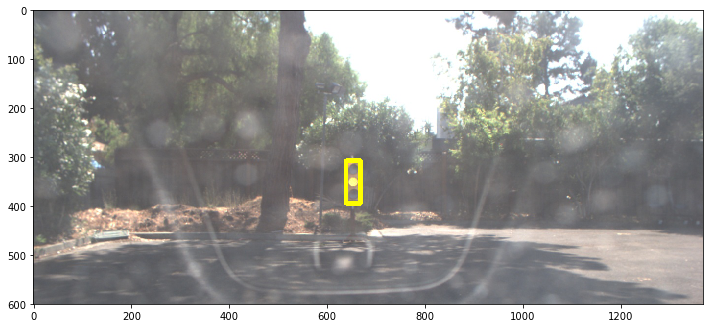

Added traffic light box=(21,58) score=0.9695 state=
Discarded traffic light box=(13,19) score=0.0070
Detected 1 traffic lights out of 10 objects in 0.298s


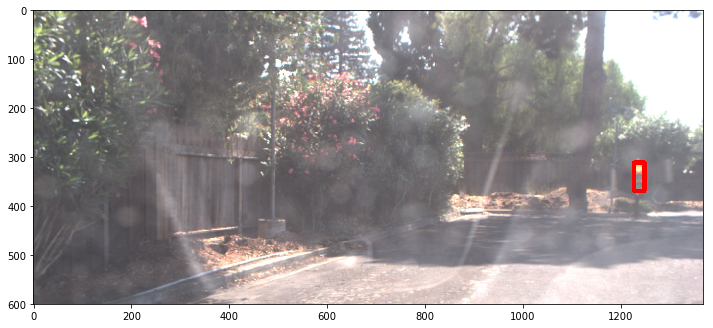

Added traffic light box=(34,88) score=0.9937 state=
Discarded traffic light box=(53,48) score=0.0009
Detected 1 traffic lights out of 10 objects in 0.312s


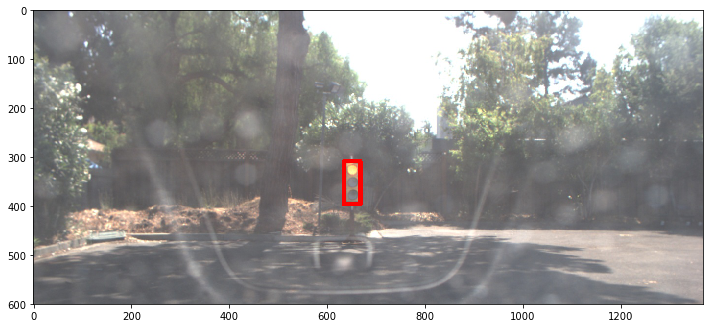

Added traffic light box=(32,84) score=0.9939 state=
Discarded traffic light box=(10,12) score=0.0008
Detected 1 traffic lights out of 10 objects in 0.296s


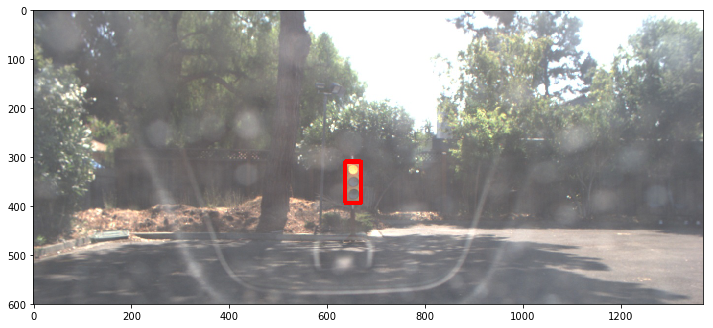

Added traffic light box=(70,193) score=0.9978 state=
Discarded traffic light box=(7,11) score=0.0065
Detected 1 traffic lights out of 10 objects in 0.301s


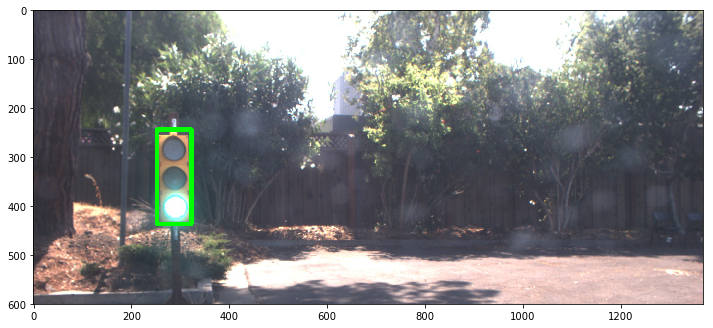

In [9]:
MIN_SCORE_THRESHOLD = .75
MAX_DETECTIONS = 10
MIN_BOX_WIDTH = 15
MAX_BOX_RATIO = 0.6

tl_images = []

with detection_graph.as_default():
  with tf.Session(graph=detection_graph) as sess:
    # Definite input and output Tensors for detection_graph
    image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
    # Each box represents a part of the image where a particular object was detected.
    detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
    # Each score represent how level of confidence for each of the objects.
    # Score is shown on the result image, together with the class label.
    detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
    detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
    num_detections = detection_graph.get_tensor_by_name('num_detections:0')
    for image_path in TEST_IMAGE_PATHS:
      image = Image.open(image_path)
      # the array based representation of the image will be used later in order to prepare the
      # result image with boxes and labels on it.
      image_np = load_image_into_numpy_array(image)
      image_np = image_np[100:700,:,:]
      # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
      image_np_expanded = np.expand_dims(image_np, axis=0)
      # Actual detection.
      start = time.clock()
    
      (boxes, scores, classes, num) = sess.run(
          [detection_boxes, detection_scores, detection_classes, num_detections],
          feed_dict={image_tensor: image_np_expanded})
      
      elapsed_s = time.clock() - start
      # Visualization of the results of a detection.  
      boxes = np.squeeze(boxes)
      scores = np.squeeze(scores)
      classes = np.squeeze(classes).astype(np.int32)
    
      sorted_indexes = np.argsort(scores)
    
      tl_boxes = []
      tl_states = []
      im_height, im_width, im_ch = image_np.shape

      for i in reversed(sorted_indexes):
        class_name = ""
        if classes[i] in category_index.keys():
          class_name = category_index[classes[i]]['name']

        if (class_name == 'traffic light'):
          
          ymin, xmin, ymax, xmax = (int(round(boxes[i][0] * im_height)), int(round(boxes[i][1] * im_width)),
                                    int(round(boxes[i][2] * im_height)), int(round(boxes[i][3] * im_width)))
          
          box_w = xmax - xmin
          box_h = ymax - ymin
          box_ratio = box_w / box_h
          
          if (scores[i] < MIN_SCORE_THRESHOLD) or (box_w < MIN_BOX_WIDTH) or (box_ratio > MAX_BOX_RATIO):
            print("Discarded traffic light box=({},{}) score={:.4f}".format(box_w, box_h, scores[i]))
            continue
            
          tl_image = image_np[ymin:ymax,xmin:xmax,:]
          tl_state = get_traffic_light_state(tl_image)
          tl_color = ((255,0,0), (255,255,0), (0,255,0), (0,0,255))[tl_state]
          tl_boxes.append(((xmin, ymin), (xmax, ymax), tl_color))
          tl_images.append(np.copy(tl_image))
          print("Added traffic light box=({},{}) score={:.4f} state=".format(box_w, box_h, scores[i], tl_state))
          
          if (len(tl_boxes) >= MAX_DETECTIONS):              
            break

      print("Detected {} traffic lights out of {} objects in {:.3f}s".format(len(tl_boxes), len(boxes), elapsed_s))
    
      for box in tl_boxes:
        cv2.rectangle(image_np, box[0], box[1], box[2], 8)
      plt.figure(figsize=(12, 6))
      plt.imshow(image_np)
      plt.show()

# Classification

[ 6924.   944.   457.]
[ 8637.     0.     0.]


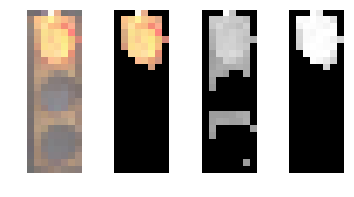

[ 1182.   296.  6321.]
[ 1635.   210.  5859.]


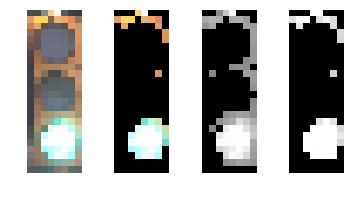

[ 6930.   779.   306.]
[ 8428.     0.     0.]


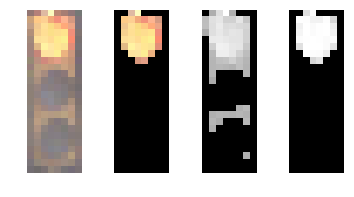

[ 5950.   709.   236.]
[ 7734.     0.     0.]


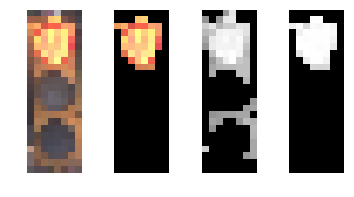

[ 6327.   505.   362.]
[ 7635.     0.     0.]


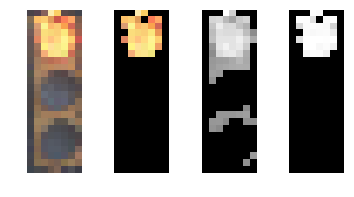

[ 1249.   767.  8162.]
[  958.     0.  7571.]


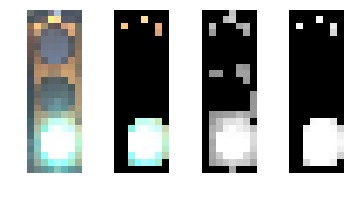

[ 2678.  6329.   864.]
[ 1147.  4977.     0.]


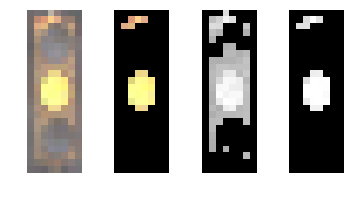

[ 2021.   981.  7457.]
[ 1639.     0.  5766.]


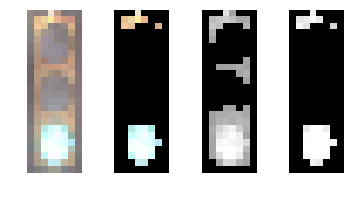

[ 4171.  2205.  2240.]
[ 3474.     0.     0.]


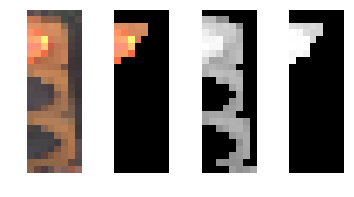

[ 1096.   327.  7934.]
[ 1185.     0.  7491.]


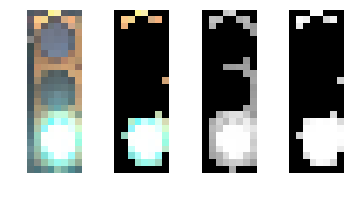

[ 7140.   758.   996.]
[ 8563.   217.     0.]


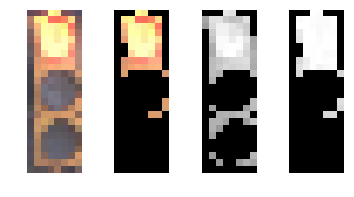

[ 1366.   470.  8219.]
[ 1166.     0.  8012.]


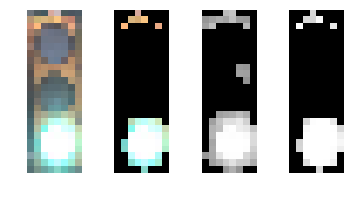

[ 6544.  1350.   291.]
[ 6848.     0.     0.]


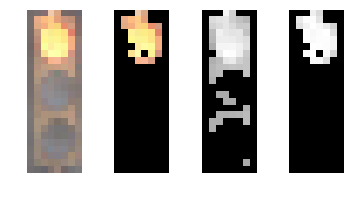

[ 1959.  6509.   292.]
[ 1132.  5689.     0.]


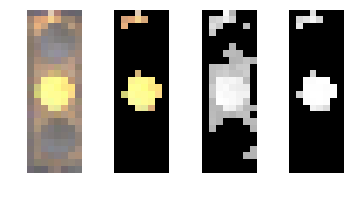

[ 7314.   657.     0.]
[ 8711.     0.     0.]


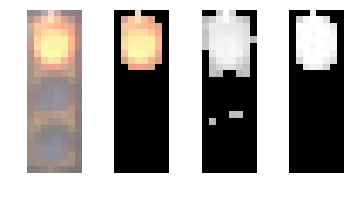

[ 6155.  1619.   145.]
[ 6426.     0.     0.]


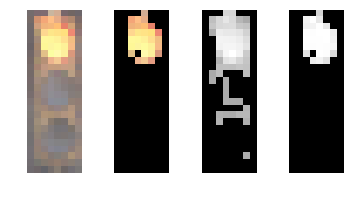

[ 6554.  1057.   294.]
[ 7316.     0.     0.]


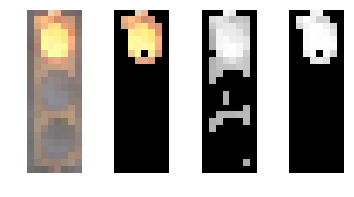

[ 1074.   774.  8213.]
[ 1203.     0.  8012.]


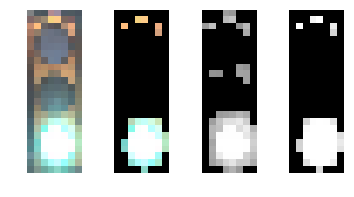

In [10]:
TRAFFIC_LIGHT_SHAPE = (8, 24)

w, h = TRAFFIC_LIGHT_SHAPE

h1 = h//3
h2 = (2 * h) // 3

HSV_V_THRESHOLD = 210

def color_threshold(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    lower_red = np.array([150, 0, HSV_V_THRESHOLD])
    upper_red = np.array([180, 255,255])
    red_mask1 = cv2.inRange(hsv[:h1,:], lower_red, upper_red)

    lower_red = np.array([0, 0, HSV_V_THRESHOLD])
    upper_red = np.array([30, 255,255])
    red_mask2 = cv2.inRange(hsv[:h1,:], lower_red, upper_red)
    
    red_mask = red_mask1 + red_mask2
    
    lower_yellow = np.array([0, 0, HSV_V_THRESHOLD]) 
    upper_yellow = np.array([60, 255, 255])    
    yellow_mask = cv2.inRange(hsv[h1:h2,:], lower_yellow, upper_yellow)
    
    lower_green = np.array([30, 0, HSV_V_THRESHOLD]) 
    upper_green = np.array([100, 255, 255])    
    green_mask = cv2.inRange(hsv[h2:,:], lower_green, upper_green)

    color_mask = np.vstack((red_mask, yellow_mask, green_mask))

    lower_white = np.array([0, 0, 245])
    upper_white = np.array([180, 10, 255])
    white_mask = cv2.inRange(hsv, lower_white, upper_white)
    
    tl_mask = cv2.bitwise_or(white_mask, color_mask)
    
    hsv[tl_mask == 0] = 0
    return hsv

def denoise(image):
    average = int(round(np.sum(np.sum(image, axis=1, dtype=np.float32)) / (h*w)))
    out_image = np.copy(image)
    out_image[image <= average] = 0
    #image[image > 0] -= average
    return out_image

def get_traffic_light_intensity(image):
    intensity = np.hstack((np.sum(np.sum(image[1:h1-1,1:-1], axis=1, dtype=np.float32)), 
                           np.sum(np.sum(image[h1+1:h2-1,1:-1], axis=1, dtype=np.float32)), 
                           np.sum(np.sum(image[h2+1:-1,1:-1], axis=1, dtype=np.float32))))
        
    return intensity

for i, tl_image in enumerate(tl_images):
    tl_image = cv2.resize(tl_image, TRAFFIC_LIGHT_SHAPE)

    hls = cv2.cvtColor(tl_image, cv2.COLOR_RGB2HLS)   
    hsv_masked = color_threshold(tl_image)
    tl_masked = cv2.cvtColor(hsv_masked, cv2.COLOR_HSV2RGB)
    
    filter1 = hls[:,:,1]
    filter1 = denoise(filter1)
    print(get_traffic_light_intensity(filter1))
    
    filter2 = hsv_masked[:,:,2]
    print(get_traffic_light_intensity(filter2))
        
    fig, axes = plt.subplots(1, 4, figsize=(6,3))
    for ax in axes:
        ax.set_axis_off()
        
    axes[0].imshow(tl_image)
    axes[1].imshow(tl_masked)            
    axes[2].imshow(filter1, cmap='gray')
    axes[3].imshow(filter2, cmap='gray')
    plt.show()